In [1]:
import os
import numpy as np
import velocyto as vcy
from scipy import sparse
import anndata as ad
import umap.umap_ as umap
import scanpy as sc
import pandas as pd
from collections import Counter
import dynamo as dyn
from scipy.sparse import csr_matrix
from dynamo.tools.moments import *
from anndata import AnnData

2023-04-17 14:25:22.469369: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /users/anna.hakobyan/centos/usr/lib:/users/anna.hakobyan/centos/usr/lib64:/lib:/lib64:/usr/lib:/usr/lib64
2023-04-17 14:25:22.469415: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


/users/anna.hakobyan/.conda/envs/scpython/lib/python3.9/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.3 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.3, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [2]:
import scvelo as scv

In [3]:
from dynamo.tools.velocyto_scvelo import *

In [4]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [7, 7]

### Reading hvg_subset annotations

In [5]:
# ### Directory TM_combined_datasets_SA_ann_obs
# combined_datasets = sc.read_h5ad(filename = "TM_combined_datasets_SA_ann.h5ad")
# obs_plk = pd.read_pickle("TM_combined_datasets_SA_ann_obs.plk")
# combined_datasets.obs = obs_plk

In [6]:
hvg = sc.read("../output/hvg_integrated.h5ad")
# SA_exps = combined_datasets[combined_datasets.obs["study_id"].isin(['SA_pilot', 'SA_final'])]

In [7]:
bm = sc.read("../output/bm_integrated.h5ad")

In [8]:
hvg_subset_mature = sc.read_loom(filename = "hvg_subset_mature_MA_annotations_redone.loom")
hvg_subset_mature.obs_names = hvg_subset_mature.obs["obs_names"]

hvg_subset_HSC = sc.read_loom(filename = "hvg_subset_HSC_MA_annotations_redone.loom")
hvg_subset_HSC.obs_names = hvg_subset_HSC.obs["obs_names"]

In [9]:
hvg_subset_mature.obs_names

Index(['AAACGCTTCTCCTGTG-1', 'AAAGAACCACTACACA-1', 'AAAGAACCAGCCGTCA-1',
       'AAAGGATGTAGCTAAA-1', 'AACAAAGGTGTTGCCG-1', 'AACAAAGTCACAGTGT-1',
       'AACAAGAGTGGCGCTT-1', 'AACACACTCCCTTGGT-1', 'AACCATGAGCGTGAAC-1',
       'AACCATGAGGGTTAGC-1',
       ...
       'TTTCGATAGAGGTCGT-1', 'TTTCGATCAACACAAA-1', 'TTTGACTCACACGGTC-1',
       'TTTGACTTCGCCACTT-1', 'TTTGATCTCTCGGTCT-1', 'TTTGGAGCACGGTGCT-1',
       'TTTGGTTCAGAGACTG-1', 'TTTGTTGAGCACGATG-1', 'TTTGTTGGTCCACTCT-1',
       'TTTGTTGGTCCTGGTG-1'],
      dtype='object', name='obs_names', length=3385)

### Reading annotations

In [10]:
# vlm_pilot = vcy.VelocytoLoom("../output/MR_30_10X_SA_PBS_BM_22112021_transcriptome.loom")
# vlm_final = vcy.VelocytoLoom("../output/MR_33_10X_SA_PBS_BM_transcriptome.loom")

In [11]:
# np.sum(vlm_pilot.U, axis = 0)

In [12]:
def filter_cells_transfer_annotations(vlm, id_dict, ann_dict):
    
    cellids_trunc = map (lambda x: x[-17:-1], vlm.ca["CellID"])
    cellids_keep = [x in id_dict for x in cellids_trunc]
    vlm.filter_cells(np.array(cellids_keep))
    
    vlm.ca["CellID"] = [ id_dict[x] for x in map (lambda x: x[-17:-1], vlm.ca["CellID"] ) ]
    vlm.set_clusters(np.array([ann_dict[x] for x in vlm.ca["CellID"]]))

In [13]:
hvg_subset_cellids = dict(zip(map(lambda x: x[-18:-2], hvg_subset_mature.obs["obs_names"]), hvg_subset_mature.obs["obs_names"], ))
hvg_subset_HSC_cellids = dict(zip(map(lambda x: x[-18:-2], hvg_subset_HSC.obs["obs_names"]), hvg_subset_HSC.obs["obs_names"], ))

hvg_subset_cellids.update(hvg_subset_HSC_cellids)

In [14]:
hvg_subset_MAann = dict(zip(hvg_subset_mature.obs["obs_names"], hvg_subset_mature.obs["Mariem_annotation"], ))
hvg_subset_HSC_MAann = dict(zip(hvg_subset_HSC.obs["obs_names"], hvg_subset_HSC.obs["Mariem_annotation"], ) )

hvg_subset_MAann.update(hvg_subset_HSC_MAann)

In [15]:
# filter_cells_transfer_annotations(vlm_pilot, hvg_subset_cellids, hvg_subset_MAann)
# vlm_pilot.ca["Clusters"] = vlm_pilot.cluster_labels
# filter_cells_transfer_annotations(vlm_final, hvg_subset_cellids, hvg_subset_MAann)
# vlm_final.ca["Clusters"] = vlm_final.cluster_labels

### Reading velocyto out into scvelo

In [16]:
ldata_pilot = scv.read("../output/MR_30_10X_SA_PBS_BM_22112021_transcriptome.loom")
ldata_final = scv.read("../output/MR_33_10X_SA_PBS_BM_transcriptome.loom")

In [17]:
def scv_filter_cells_transfer_annotations(scv_input, id_dict, ann_dict):
    
    cellids_trunc = list(map (lambda x: x[-17:-1], scv_input.obs_names))
    cellids_keep = [x in id_dict for x in cellids_trunc]
    scv_input = scv_input[cellids_keep, ]
    
    scv_input.obs["obs_names"] = [ id_dict[x] for x in map (lambda x: x[-17:-1], scv_input.obs_names) ]
    scv_input.obs_names = scv_input.obs["obs_names"]
    scv_input.obs["Cluster"] = [ann_dict[x] for x in scv_input.obs["obs_names"]]
    return(scv_input)

In [18]:
ldata_pilot = scv_filter_cells_transfer_annotations(ldata_pilot, hvg_subset_cellids, hvg_subset_MAann)
ldata_final = scv_filter_cells_transfer_annotations(ldata_final, hvg_subset_cellids, hvg_subset_MAann)


In [19]:
print(ldata_pilot.shape, ldata_final.shape)

(3966, 6185) (1548, 6185)


In [20]:
def scv_filter_common_genes(scv_input, anndata_input):
    common_genes = scv_input.var_names.intersection(anndata_input.var_names)
    scv_input = scv_input[:, scv_input.var_names.isin(common_genes)]
    return(scv_input)

In [21]:
ldata_pilot_filtered = scv_filter_common_genes(ldata_pilot, hvg)
ldata_final_filtered = scv_filter_common_genes(ldata_final, hvg)

In [22]:
ldata_pilot_filtered.layers["spliced"].toarray()

array([[0, 0, 0, ..., 0, 1, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 1, 3, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [23]:
def recalibrate_sp_unsp(scv_input, anndata_input):
    sp = scv_input.layers["spliced"]
    unsp = scv_input.layers["unspliced"]
    
    total_exp = sp.toarray() + unsp.toarray()
        
    # print(sp.shape)
    scvi_counts = anndata_input[scv_input.obs["obs_names"], scv_input.var_names].X
    # print(scvi_counts.shape)

    sp_recal = np.nan_to_num(scvi_counts.toarray() * sp.toarray() / total_exp)
    unsp_recal = np.nan_to_num(scvi_counts.toarray() * unsp.toarray() / total_exp)
    scv_input.layers["spliced"] = sparse.csr_matrix(sp_recal)
    scv_input.layers["unspliced"] = sparse.csr_matrix(unsp_recal)
    return(scv_input)

In [27]:
ldata_pilot_recal = recalibrate_sp_unsp(ldata_pilot_filtered, hvg)
ldata_final_recal = recalibrate_sp_unsp(ldata_final_filtered, hvg)

In [28]:
ldata_pilot_recal.layers["spliced"].toarray()

array([[ 0.       ,  0.       ,  0.       , ...,  0.       , 14.224751 ,
        14.224751 ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  3.3909798,  0.       , ...,  1.6954899,  5.08647  ,
         1.6954899],
       ...,
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ]], dtype=float32)

In [29]:
ldata_pilot_recal

AnnData object with n_obs × n_vars = 3966 × 1030
    obs: 'obs_names', 'Cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [30]:
ldata_pilot

AnnData object with n_obs × n_vars = 3966 × 6185
    obs: 'obs_names', 'Cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [31]:
ldata_concat = ad.concat([ldata_pilot_recal, ldata_final_recal])
# ldata_concat = ad.concat([ldata_pilot_filtered, ldata_final_filtered])

In [32]:
ldata_concat.layers["spliced"].toarray().shape


(5514, 1030)

In [33]:
ldata_concat.var_names.shape

(1030,)

In [34]:
ldata_concat.obs_names = ldata_concat.obs["obs_names"]

In [35]:
ldata_concat.var

""
Gene
Mrpl15
Snhg6
Ppp1r42
Slco5a1
Eya1
...
Tmem38b
Zfp462
Dnajc25


In [36]:
ldata_df = pd.DataFrame(ldata_concat.X.toarray(), columns = ldata_concat.var_names, index = ldata_concat.obs_names)

In [37]:
ldata_concat.obs

,obs_names,Cluster
obs_names,,
AAAGAACTCCGGTAGC-1,AAAGAACTCCGGTAGC-1,CLP
AAACGCTAGACCCTTA-1,AAACGCTAGACCCTTA-1,Other
AAAGGTAAGCTTCGTA-1,AAAGGTAAGCTTCGTA-1,Erythroblast
AAAGAACAGAGCCTGA-1,AAAGAACAGAGCCTGA-1,ILC
AAACCCAAGTCAGGGT-1,AAACCCAAGTCAGGGT-1,HSC
...,...,...
TTTGGAGTCGATTTCT-1,TTTGGAGTCGATTTCT-1,Other
TTCTTGAAGGGCAGTT-1,TTCTTGAAGGGCAGTT-1,Macrophage
TTTAGTCAGCCTGAAG-1,TTTAGTCAGCCTGAAG-1,CMP


In [38]:
def anndata_to_celldancer(adata):
    """
    This function transforms the anndata into a dataframe that can be passed to cellDancer.
    """
    
    adata.obs_names = adata.obs["obs_names"]
    
    adata_spliced = pd.DataFrame(adata.layers["spliced"].toarray(),
                                 columns = adata.var_names, index = adata.obs_names)
    
    adata_unspliced = pd.DataFrame(adata.layers["unspliced"].toarray(),
                                 columns = adata.var_names, index = adata.obs_names)
    
    adata_spliced.index.name = 'cell_id'
    adata_unspliced.index.name = 'cell_id'

    
  
    # Extract the gene names
    gene_names = adata.var_names.tolist()

    # Map cell IDs to annotations
    annotations = adata.obs["Cluster"].tolist()
    cell_to_annotation = dict(zip(adata.obs_names, annotations))
    
    
    # Melt the dataframes to reshape them into long format
    spliced_df = adata_spliced.reset_index().melt(id_vars='cell_id', var_name='gene_name', value_name='spliced')
    unspliced_df = adata_unspliced.reset_index().melt(id_vars='cell_id', var_name='gene_name', value_name='unspliced')

    # Merge the spliced and unspliced dataframes
    merged_df = pd.merge(spliced_df, unspliced_df, on=['cell_id', 'gene_name'])

    # Add the annotation information to the merged dataframe
    merged_df['clusters'] = merged_df['cell_id'].map(cell_to_annotation)

    # Reorder the columns in the dataframe
    merged_df = merged_df[['spliced', 'unspliced', 'gene_name', 'cell_id', 'clusters']]

    return(merged_df)


In [99]:
ldata_celldancer = anndata_to_celldancer(ldata_concat)

In [100]:
ldata_celldancer

,spliced,unspliced,gene_name,cell_id,clusters
0,0.0,0.0,Mrpl15,AAAGAACTCCGGTAGC-1,CLP
1,0.0,0.0,Mrpl15,AAACGCTAGACCCTTA-1,Other
2,0.0,0.0,Mrpl15,AAAGGTAAGCTTCGTA-1,Erythroblast
3,0.0,0.0,Mrpl15,AAAGAACAGAGCCTGA-1,ILC
4,0.0,0.0,Mrpl15,AAACCCAAGTCAGGGT-1,HSC
...,...,...,...,...,...
5679415,0.0,0.0,Ugcg,TTTGGAGTCGATTTCT-1,Other
5679416,0.0,0.0,Ugcg,TTCTTGAAGGGCAGTT-1,Macrophage
5679417,0.0,0.0,Ugcg,TTTAGTCAGCCTGAAG-1,CMP
5679418,0.0,0.0,Ugcg,TTTCATGGTTAACAGA-1,Monocyte


In [102]:
ldata_celldancer["unspliced"].mean()

0.12712709605693817

In [49]:
ldata_concat.shape

(5514, 1030)

In [93]:
# hvg_velo = scv.utils.merge(hvg, ldata_concat)
hvg_velo = scv.utils.merge(hvg, ldata_pilot_filtered)

In [94]:
sc.tl.pca(hvg_velo)
sc.pp.neighbors(hvg_velo)
sc.tl.umap(hvg_velo, random_state=1)


In [95]:
hvg_subset_MAann[hvg_velo.obs_names[1]]

'Dendritic'

In [96]:
hvg_velo.obs["MA_annotation"] = [hvg_subset_MAann[x] for x in hvg_velo.obs_names]

In [97]:
hvg_velo.shape

(3966, 1030)

In [98]:
hvg_velo


AnnData object with n_obs × n_vars = 3966 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'HTO_maxID_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_mde', 'X_pca', 'X_scVI', 'X_tsne', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    varm: 'PCs'
    layers: 'counts', 'scVI_normalized', 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [99]:
scv.pp.filter_and_normalize(hvg_velo, enforce = True)

Normalized count data: X, spliced, unspliced.


In [100]:
scv.pp.moments(hvg_velo)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [101]:
# sc.pp.highly_variable_genes(hvg_velo)

In [102]:
scv.tl.velocity(hvg_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [103]:
scv.tl.velocity_graph(hvg_velo)

computing velocity graph (using 1/76 cores)


  0%|          | 0/3966 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


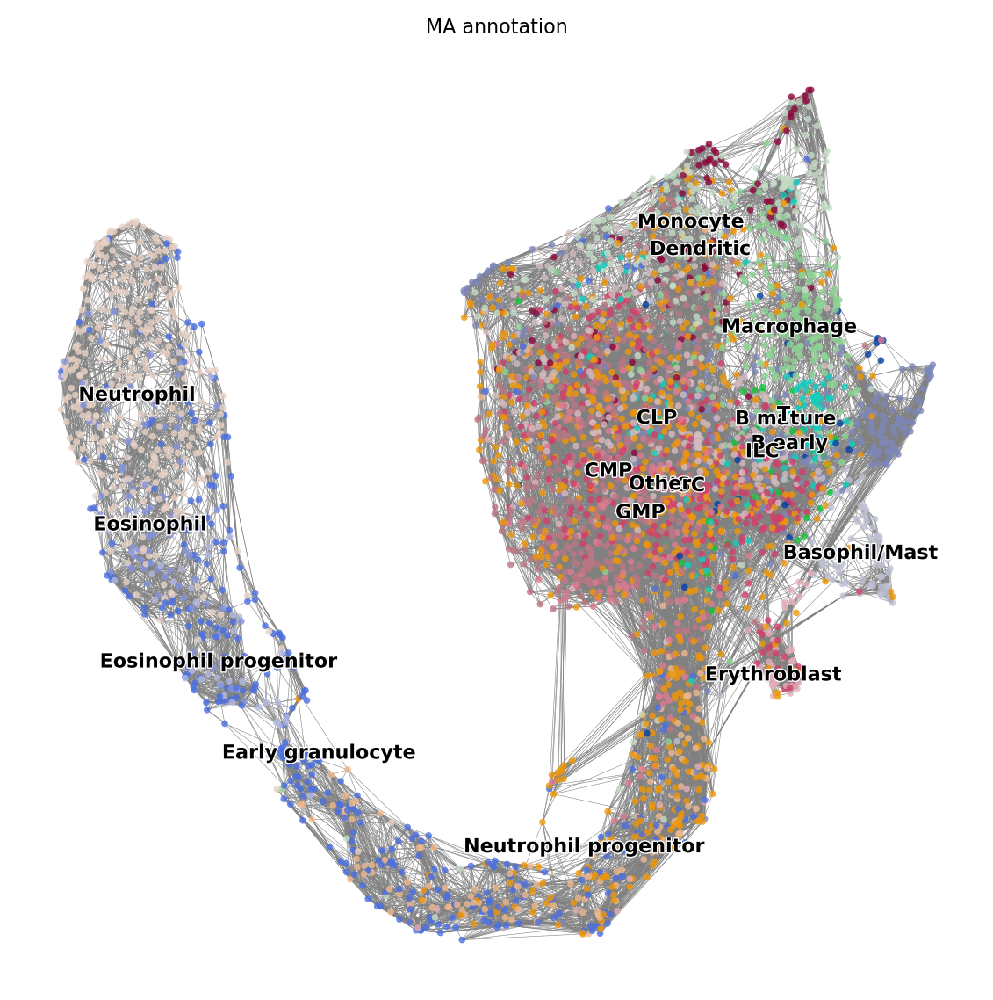

In [104]:
scv.pl.velocity_graph(hvg_velo, basis = "umap", color = "MA_annotation")

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


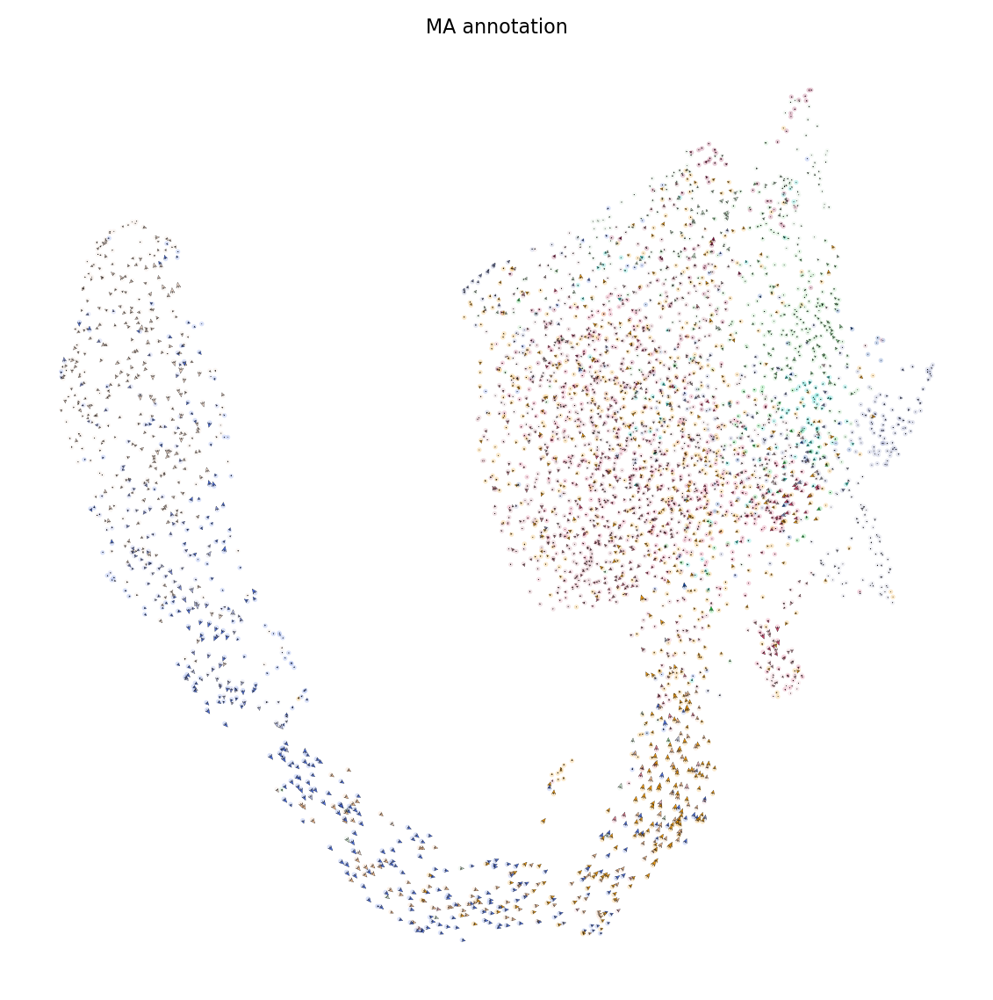

In [105]:
scv.pl.velocity_embedding(hvg_velo, basis = 'umap', color = "MA_annotation")

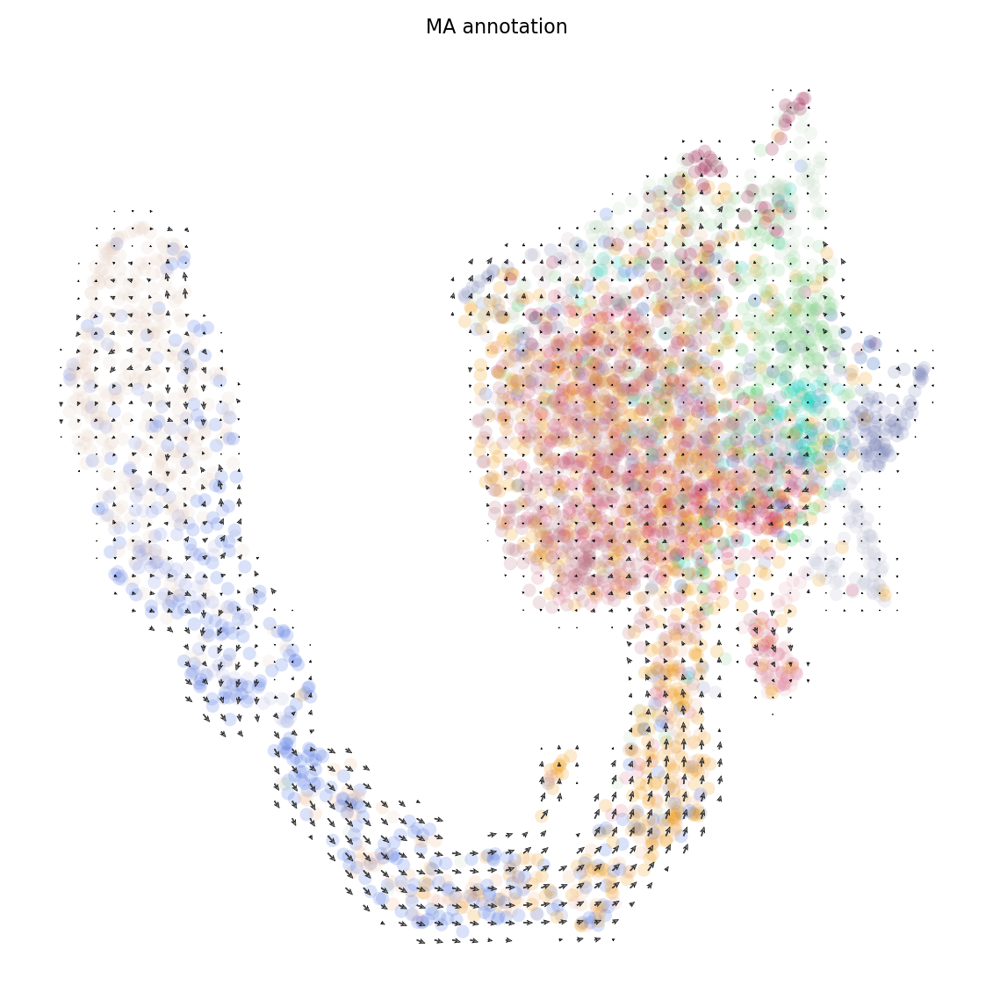

In [106]:
scv.pl.velocity_embedding_grid(hvg_velo, basis = 'umap', color = "MA_annotation")

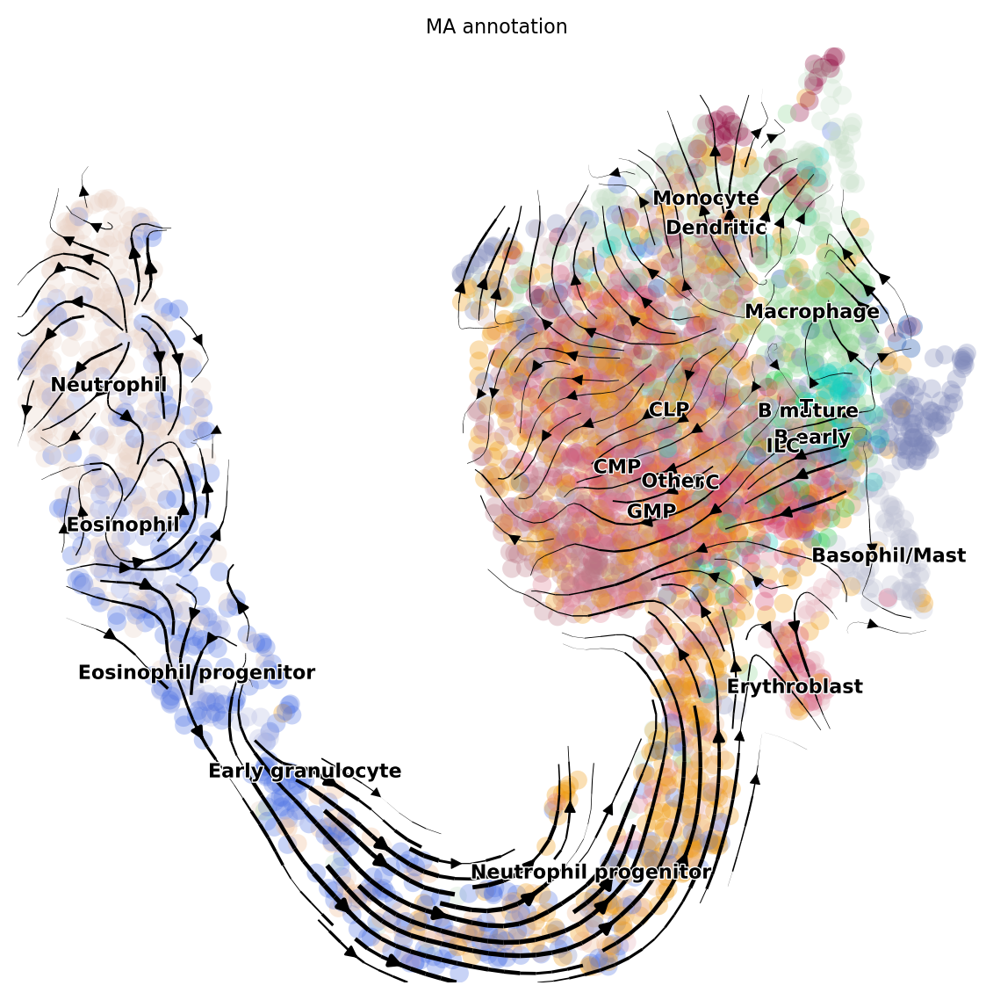

In [107]:
scv.pl.velocity_embedding_stream(hvg_velo, basis = 'umap', color = "MA_annotation")

In [108]:
# scv.pl.velocity(hvg_velo, "C5ar1")

In [109]:
scv.tl.rank_velocity_genes(hvg_velo, groupby = 'MA_annotation', min_corr = 0.3)

ranking velocity genes


/users/anna.hakobyan/.conda/envs/scpython/lib/python3.9/site-packages/scvelo/tools/utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [110]:
hvg_velo.var

,Accession,Chromosome,End,Start,Strand,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes,spearmans_score,velocity_score
1110008P14Rik,ENSMUSG00000039195,2,32381938,32377097,-,0.001869,0.001869,-0.002578,False,0.151299,0
1700001O22Rik,ENSMUSG00000044320,2,30803661,30794769,-,0.000000,0.000000,-0.055126,False,NaN,0
1700010K24Rik,ENSMUSG00000085102,3,108256985,108248909,-,0.000000,0.000000,0.000000,False,NaN,0
1700025G04Rik,ENSMUSG00000032666,1,152090125,151852403,-,0.728847,0.728847,-0.173684,False,0.471908,0
1700037H04Rik,ENSMUSG00000027327,2,131160081,131146324,-,0.005107,0.005107,-0.497931,False,0.172930,0
...,...,...,...,...,...,...,...,...,...,...,...
Zfp937,ENSMUSG00000060336,2,150240725,150218073,+,0.000000,0.000000,0.000000,False,NaN,0
Zfyve19,ENSMUSG00000068580,2,119217049,119208617,+,0.046251,0.046251,-0.284280,False,0.250997,0
Zhx3,ENSMUSG00000035877,2,160872998,160748708,-,1.485085,1.485085,-0.053824,False,0.282806,0
Zmynd19,ENSMUSG00000026974,2,24962075,24949792,+,0.021297,0.021297,-0.152140,False,0.335101,0


In [111]:
hvg_velo.var

,Accession,Chromosome,End,Start,Strand,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes,spearmans_score,velocity_score
1110008P14Rik,ENSMUSG00000039195,2,32381938,32377097,-,0.001869,0.001869,-0.002578,False,0.151299,0
1700001O22Rik,ENSMUSG00000044320,2,30803661,30794769,-,0.000000,0.000000,-0.055126,False,NaN,0
1700010K24Rik,ENSMUSG00000085102,3,108256985,108248909,-,0.000000,0.000000,0.000000,False,NaN,0
1700025G04Rik,ENSMUSG00000032666,1,152090125,151852403,-,0.728847,0.728847,-0.173684,False,0.471908,0
1700037H04Rik,ENSMUSG00000027327,2,131160081,131146324,-,0.005107,0.005107,-0.497931,False,0.172930,0
...,...,...,...,...,...,...,...,...,...,...,...
Zfp937,ENSMUSG00000060336,2,150240725,150218073,+,0.000000,0.000000,0.000000,False,NaN,0
Zfyve19,ENSMUSG00000068580,2,119217049,119208617,+,0.046251,0.046251,-0.284280,False,0.250997,0
Zhx3,ENSMUSG00000035877,2,160872998,160748708,-,1.485085,1.485085,-0.053824,False,0.282806,0
Zmynd19,ENSMUSG00000026974,2,24962075,24949792,+,0.021297,0.021297,-0.152140,False,0.335101,0


In [112]:
df = scv.DataFrame(hvg_velo.uns['rank_velocity_genes']['names'])
df.head()

/tmp/ipykernel_28268/2214859038.py:1: DeprecationWarning: `scvelo.read_load.get_df` is deprecated since scVelo v0.2.4 and will be removed in a future version. Please use `scvelo.core.get_df` instead.
  df = scv.DataFrame(hvg_velo.uns['rank_velocity_genes']['names'])


,B early,B mature,Basophil/Mast,CLP,CMP,Dendritic,Early granulocyte,Eosinophil,Eosinophil progenitor,Erythroblast,GMP,HSC,ILC,Macrophage,Monocyte,Neutrophil,Neutrophil progenitor,Other,T
0,Tnik,Tent5c,Hdc,Maml3,Atp8b4,Il6ra,Fcnb,Chil3,Fcnb,Lmna,Atp8b4,Lmo2,Il18r1,Fmnl2,Zeb2,S100a6,Cenpf,Atp8b4,Ikzf2
1,Lax1,Cacna1e,Dapp1,Bcl2,Set,Zeb2,S100a6,Fcnb,Chil3,Gfi1b,Smc4,Dapp1,Tox,Zeb2,Pid1,Cxcr2,Hspa5,Smc4,Bcl2
2,Maml3,Fndc3b,Ikzf2,Dpp4,Hnrnpa3,Camk1d,Chil3,Hck,Txnip,Car1,Pdia3,Adgrl4,Bcl2,Plekhm3,Camk1d,Hck,Smc4,Hnrnpa3,Prkcq
3,Dpp4,Bcl2,Fam129a,Il12a,Smc2,Pid1,Hck,F730016J06Rik,Stk39,Knl1,Hspa5,Dst,Ikzf2,Tbc1d8,Il6ra,Hdc,Lmna,Anp32b,Il18r1
4,Cd34,Lax1,E330020D12Rik,Atp2b4,Ifi209,Plekho1,Cxcr2,S100a6,Hck,Lmo2,Set,Car2,Ifi203,Ptprc,Ctss,Dhrs9,Fcnb,Hspa5,Tnik


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


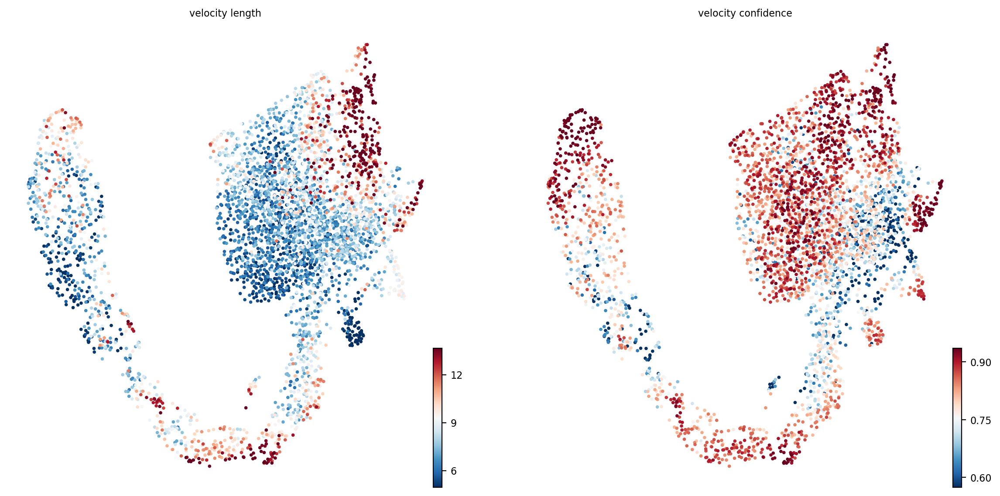

In [113]:
scv.tl.velocity_confidence(hvg_velo)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(hvg_velo, c = keys, perc = [5, 95])

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


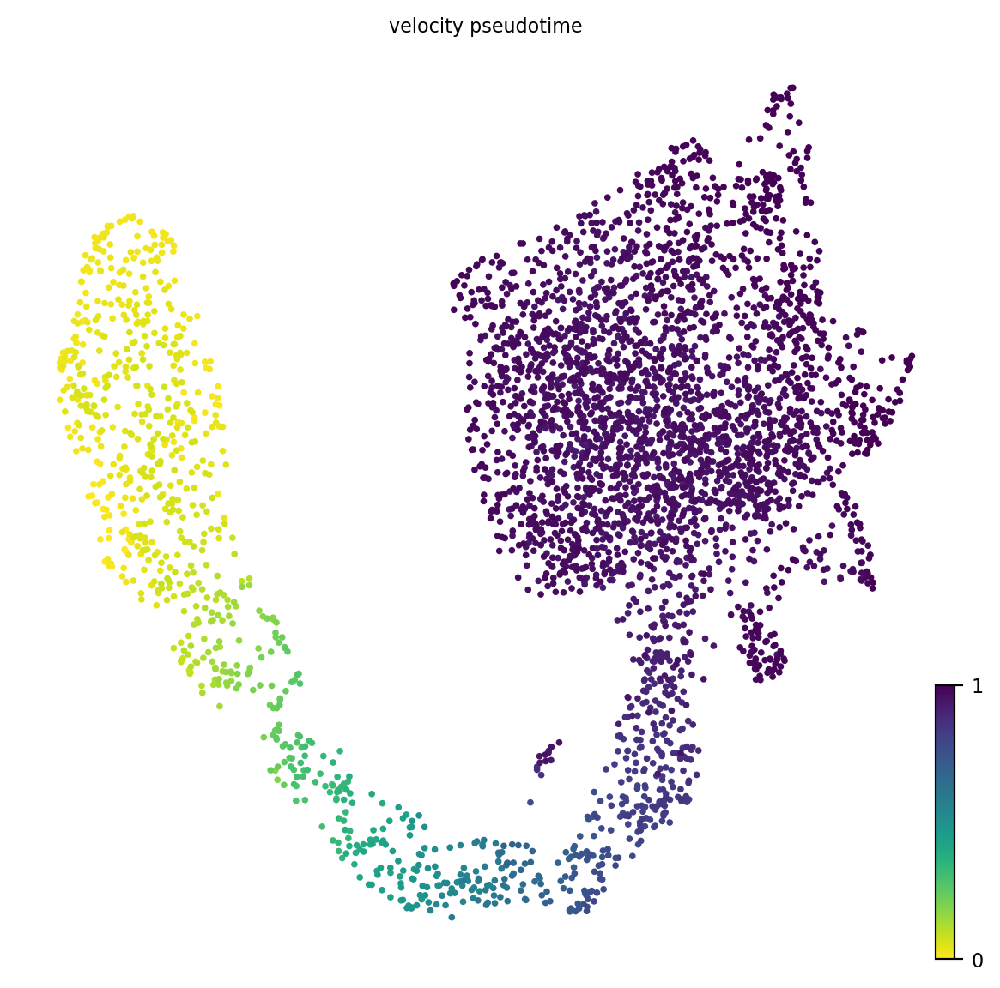

In [114]:
scv.tl.velocity_pseudotime(hvg_velo)
scv.pl.scatter(hvg_velo, color = 'velocity_pseudotime')

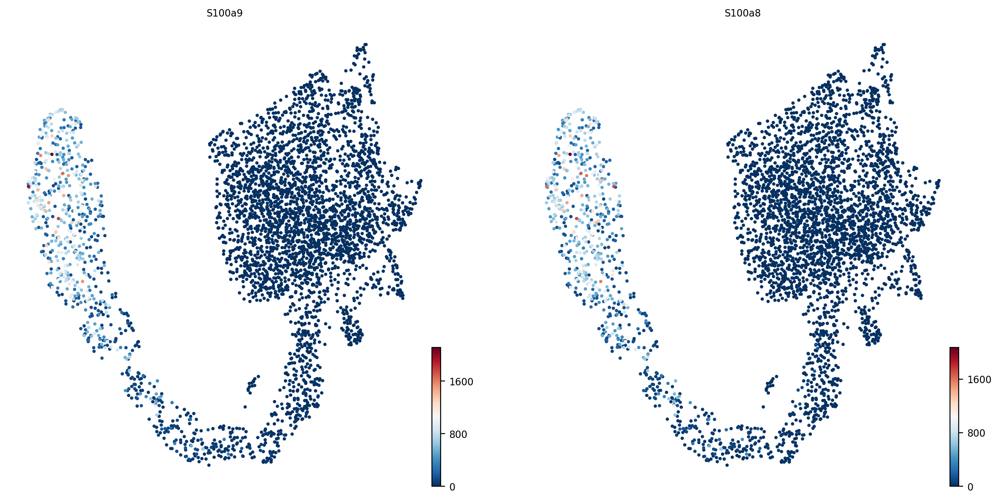

In [121]:
scv.pl.scatter(hvg_velo, color = ['S100a9', 'S100a8'])

### Dynamic model

In [115]:
scv.tl.recover_dynamics(hvg_velo, n_jobs = 15)


recovering dynamics (using 15/76 cores)


  0%|          | 0/240 [00:00<?, ?gene/s]

    finished (0:00:34) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


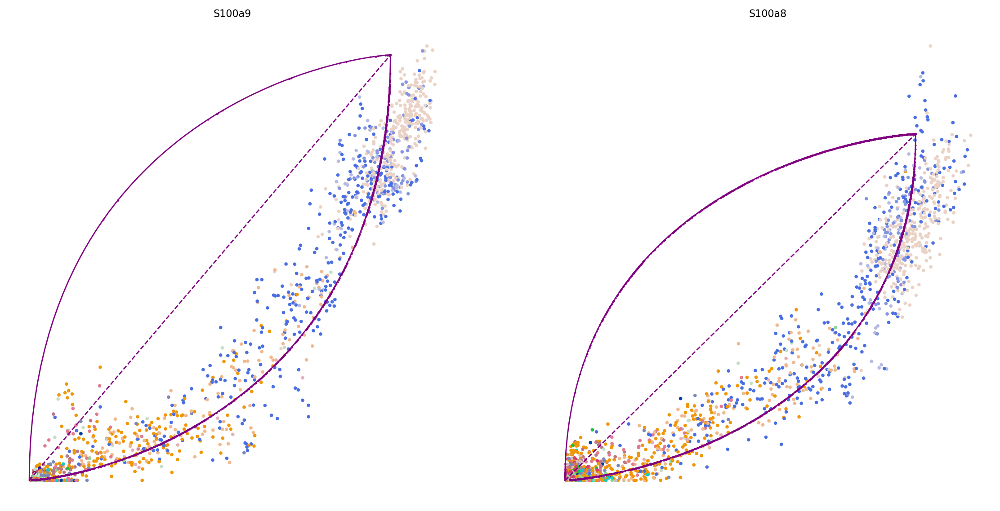

In [123]:
scv.pl.scatter(hvg_velo, basis=["S100a9", "S100a8"], color = "MA_annotation", ncols=2, frameon=False)

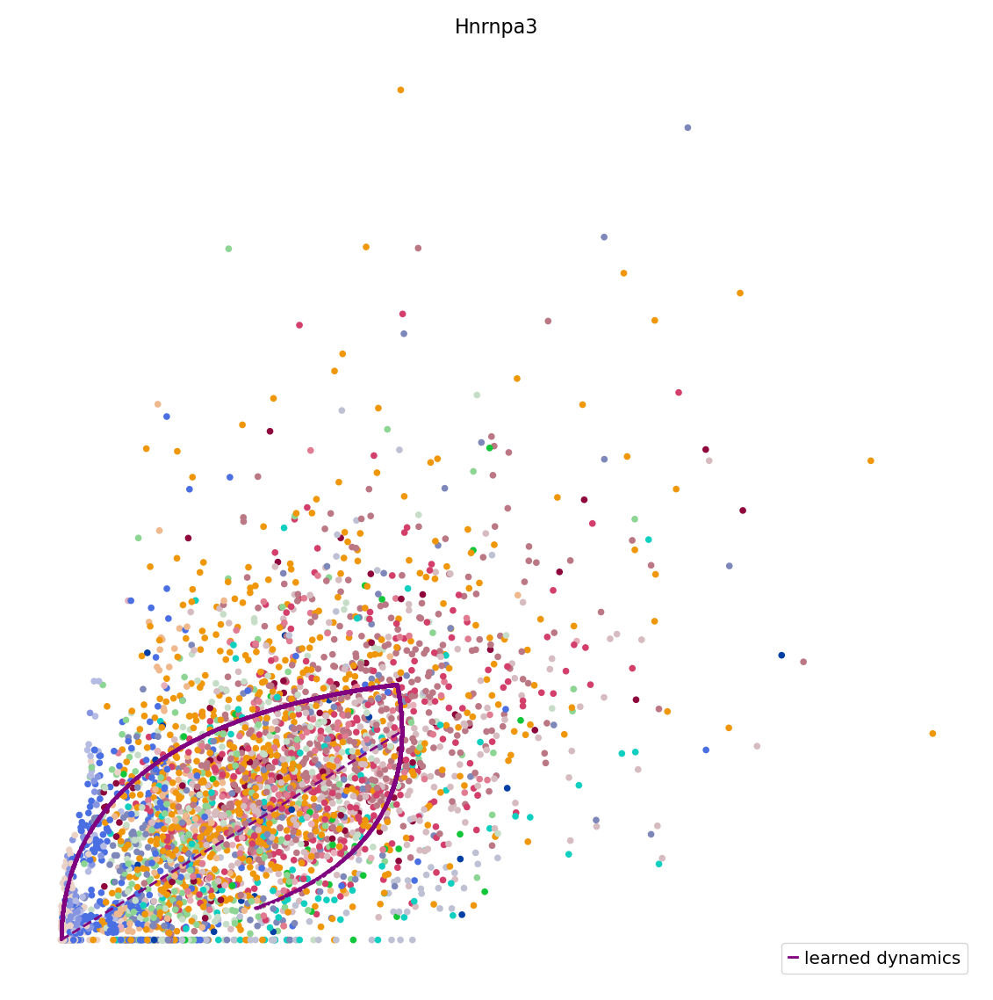

In [124]:
scv.pl.scatter(hvg_velo, basis=["Hnrnpa3"], color = "MA_annotation", ncols=2, frameon=False)

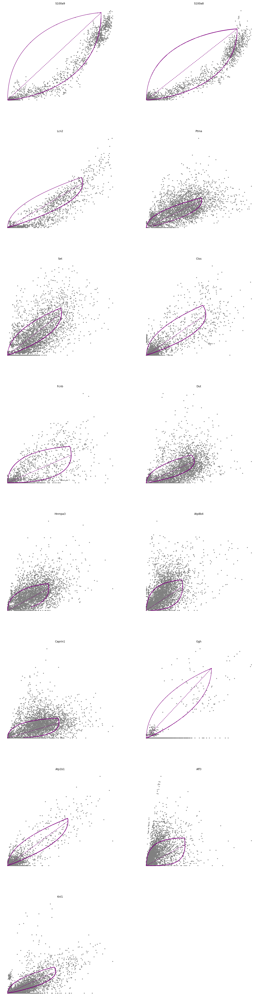

In [116]:
top_genes = hvg_velo.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(hvg_velo, basis=top_genes[:15], ncols=2, frameon=False)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/76 cores)


  0%|          | 0/3966 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


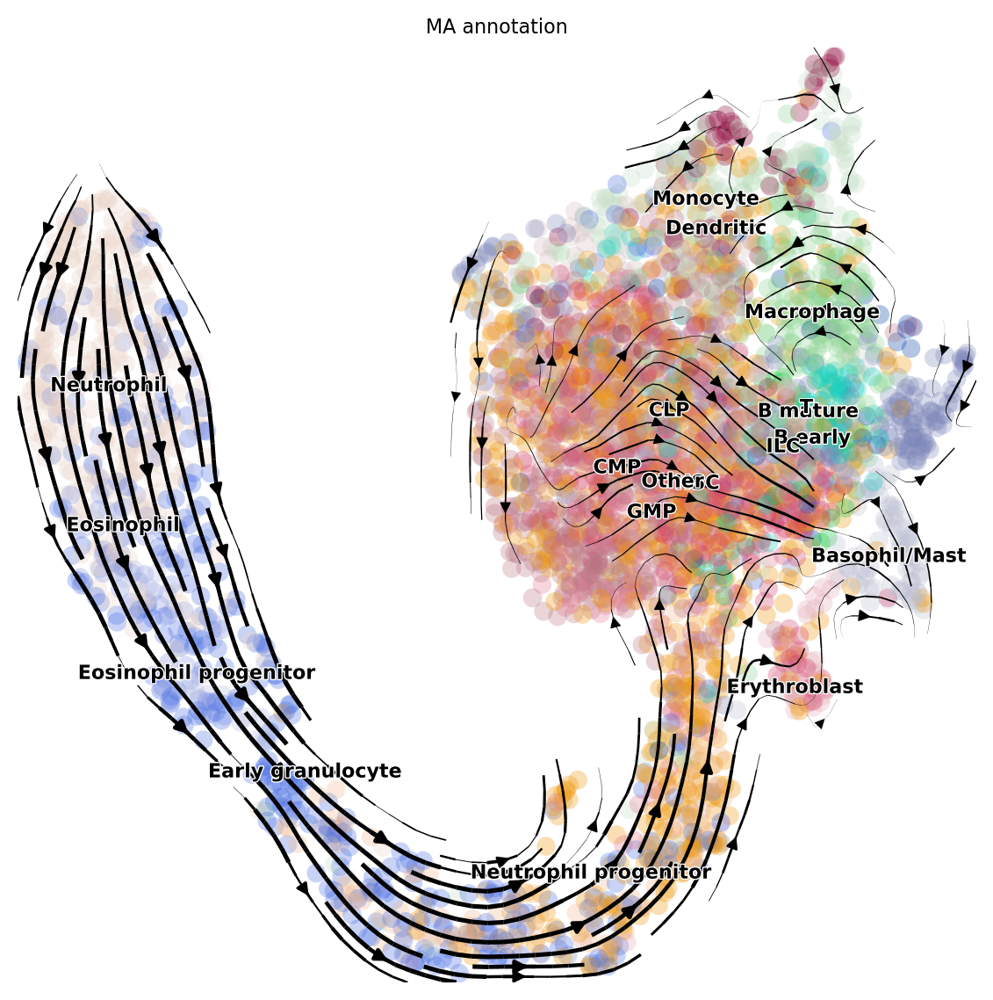

In [117]:
scv.tl.velocity(hvg_velo, mode = "dynamical")
scv.tl.velocity_graph(hvg_velo)
scv.pl.velocity_embedding_stream(hvg_velo, basis = 'umap', color = "MA_annotation")

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


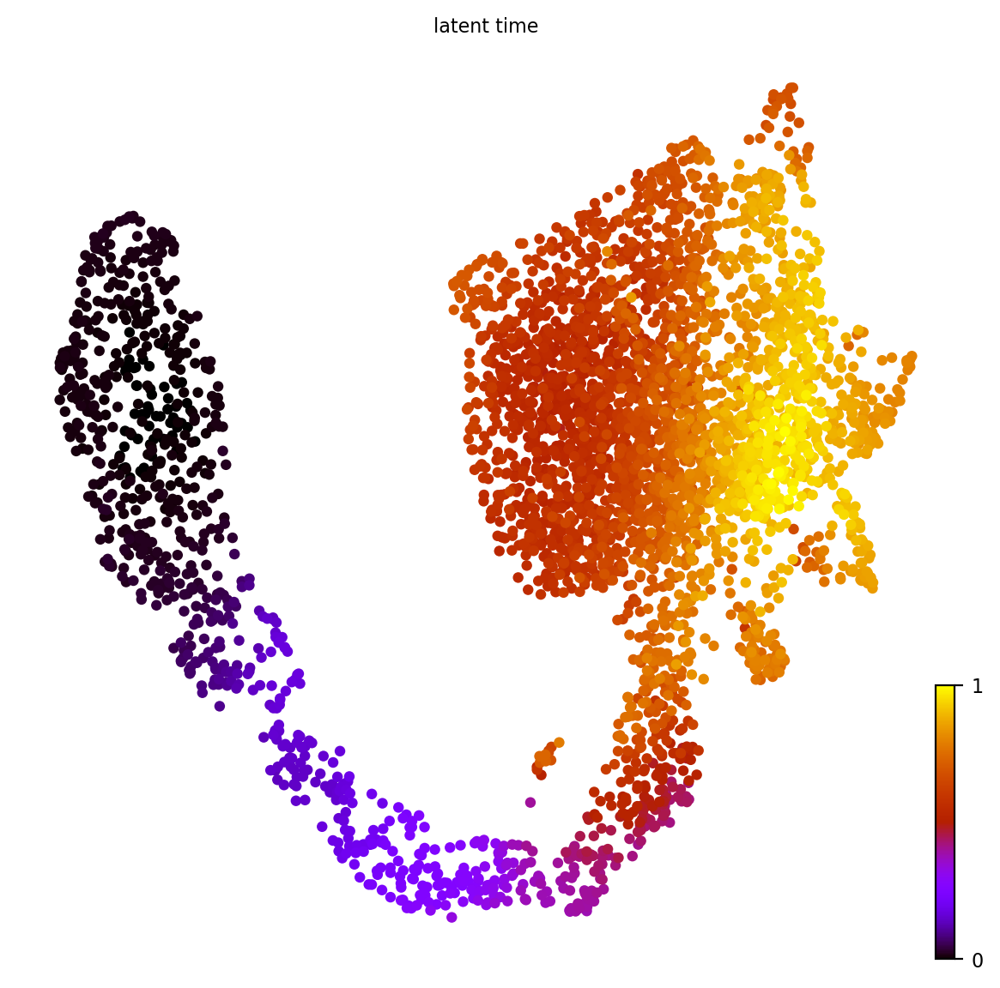

In [118]:
scv.tl.latent_time(hvg_velo)
scv.pl.scatter(hvg_velo, color = 'latent_time', color_map = 'gnuplot', size = 80)

In [119]:
hvg_velo.obs

,nCount_RNA,nFeature_RNA,sample,nCount_HTO,nFeature_HTO,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,hash.ID,...,MA_annotation,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime,latent_time
AAACCCAAGTCAGGGT-1,2346.0,1215,HTO-PBS1,764.0,3,HTO-PBS1,HTO-PBS2,2.613203,HTO-PBS1,HTO-PBS1,...,HSC,2789.134033,0.254971,9.12,0.786562,0.381573,0.000003,7.920461e-03,0.976559,0.948102
AAACCCACACAAAGCG-1,2399.0,1285,HTO-PBS1,651.0,3,HTO-PBS1,HTO-PBS2,2.907278,HTO-PBS1,HTO-PBS1,...,Dendritic,2162.647217,0.539333,7.98,0.893011,-0.064875,0.000003,4.326326e-02,0.963695,0.622706
AAACCCACAGGATTCT-1,4822.0,916,HTO-SA1,379.0,3,HTO-SA1,HTO-PBS2,2.448419,HTO-SA1,HTO-SA1,...,Neutrophil,334.912659,0.521357,11.10,0.875309,0.441424,0.235030,1.724791e-05,0.000784,0.009497
AAACCCAGTCTCACGG-1,1267.0,676,HTO-SA1,105.0,3,HTO-SA1,HTO-PBS2,1.431069,HTO-SA1,HTO-SA1,...,Other,3193.459229,0.423919,10.23,0.761189,0.022198,0.000012,3.574318e-03,0.938605,0.752963
AAACCCAGTTCAGGTT-1,2723.0,1191,HTO-PBS1,925.0,3,HTO-PBS1,HTO-PBS2,3.083565,HTO-PBS1,HTO-PBS1,...,HSC,3435.443604,0.386744,11.24,0.764595,-0.188683,0.000003,2.655555e-02,0.954358,0.804070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAGGTGTGA-1,3363.0,1269,HTO-PBS2,511.0,3,HTO-PBS2,HTO-PBS1,3.916576,HTO-PBS2,HTO-PBS2,...,CLP,2048.642822,0.450124,7.38,0.755608,0.025133,0.000003,5.730598e-02,0.967474,0.789872
TTTGGTTTCAAGTAAG-1,3192.0,1349,HTO-PBS1,660.0,3,HTO-PBS1,HTO-PBS2,2.611459,HTO-PBS1,HTO-PBS1,...,HSC,1910.476318,0.180608,6.74,0.803787,0.181700,0.000003,9.998732e-02,0.965321,0.854513
TTTGTTGAGCACGATG-1,1808.0,971,HTO-PBS1,962.0,3,HTO-PBS1,HTO-PBS2,3.615213,HTO-PBS1,HTO-PBS1,...,Macrophage,2938.260010,0.600608,10.43,0.891990,0.060433,0.000003,2.134357e-02,0.970641,0.654704
TTTGTTGGTCCACTCT-1,558.0,412,HTO-PBS2,69.0,3,HTO-PBS2,HTO-SA1,1.679065,HTO-PBS2,HTO-PBS2,...,Other,7454.476562,0.002986,9.44,0.788332,0.719245,0.000029,6.477410e-07,0.807384,0.438142


In [127]:
scv.tl.score_genes_cell_cycle(hvg_velo)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


In [128]:
hvg_velo

AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'S_score', 'G2M_score', 'phase'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr'
    uns: 'HTO_maxID_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'pp', 'PCs', 'explained_variance_ratio

### Running the scVelo analysis

In [ ]:
import scvelo as scv

In [ ]:
# adata_pilot = dyn.tl.vlm_to_adata(vlm_pilot)

In [ ]:
adata_pilot

In [ ]:
adata_scvelo = dyn.tl.run_scvelo(adata_pilot)

In [ ]:
adata_scvelo.obsm

In [ ]:
# scv.pl.velocity_embedding(adata_scvelo, basis='umap')
# scv.pl.velocity_embedding_grid(adata_scvelo, basis='umap')
scv.pl.velocity_embedding_stream(adata_scvelo, basis='umap')

In [ ]:
for key in list(adata_pilot.layers.keys()):
    if key not in ["spliced", "unspliced", "X_spliced", "X_unspliced"]:
        del adata_pilot.layers[key]

In [ ]:
adata_pilot.layers

In [ ]:
adata_pilot.layers["spliced"][:4, :4].toarray()

### Running dynamo pilot experiment

In [ ]:
dyn.configuration.set_figure_params('dynamo', background='white') # jupter notebooks
dyn.configuration.set_figure_params('dynamo', background='black') # presentation
dyn.configuration.set_pub_style() # manuscript

In [ ]:
dyn.pp.recipe_monocle(adata_pilot)

In [ ]:
dyn.tl.dynamics(adata_pilot)

In [ ]:
dyn.tl.reduceDimension(adata_pilot)


In [ ]:
dyn.tl.cell_velocities(adata_pilot, basis = "pca")

In [ ]:
# dyn.tl.cell_velocities(adata_pilot)

In [ ]:
dyn.tl.cell_wise_confidence(adata_pilot)


In [ ]:
dyn.vf.VectorField(adata_pilot, basis='pca')

In [ ]:
# dyn.vf.VectorField(adata_pilot, basis = "umap")


In [ ]:
dyn.vf.topography(adata_pilot, basis='pca')

In [ ]:
dyn.vf.topography(adata_pilot, basis='umap')

In [ ]:
dyn.ext.ddhodge(adata_pilot)


In [ ]:
adata_pilot.uns["VecFld"] = adata_pilot.uns["VecFld_pca"]

In [ ]:
dyn.pl.cell_wise_vectors(adata_pilot, color=colors, ncols=3)
dyn.pl.grid_vectors(adata_pilot, color=colors, ncols=3)
dyn.pl.streamline_plot(adata_pilot, color=colors, ncols=3)
dyn.pl.line_integral_conv(adata_pilot, )

## Running dynamo on both datasets

In [129]:
hvg_velo = scv.utils.merge(hvg, ldata_concat)

In [130]:
sc.tl.pca(hvg_velo)
sc.pp.neighbors(hvg_velo)
sc.tl.umap(hvg_velo, random_state=1)


In [131]:
hvg_subset_MAann[hvg_velo.obs_names[1]]

'Dendritic'

In [132]:
hvg_velo.obs["MA_annotation"] = [hvg_subset_MAann[x] for x in hvg_velo.obs_names]

In [133]:
dyn.configuration.set_figure_params('dynamo', background='white') # jupter notebooks
dyn.configuration.set_figure_params('dynamo', background='black') # presentation
dyn.configuration.set_pub_style() # manuscript

/users/anna.hakobyan/.conda/envs/scpython/lib/python3.9/site-packages/dynamo/configuration.py:655: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [134]:
dyn.pp.recipe_monocle(hvg_velo, n_top_genes = 1450)

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['

In [135]:
hvg_velo

AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr'
    uns: 'HTO_maxID_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'pp', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'featu

In [136]:
for key in list(hvg_velo.layers.keys()):
    if key not in ["spliced", "unspliced", "X_spliced", "X_unspliced"]:
        del hvg_velo.layers[key]

In [137]:
hvg_velo.layers["unspliced"].shape

(5514, 1030)

In [138]:
hvg_velo.shape

(5514, 1030)

In [139]:
dyn.tl.dynamics(hvg_velo)

|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [22.5251s]


estimating gamma: 100%|█████████████████████| 1012/1012 [00:41<00:00, 24.27it/s]


AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'H

In [140]:
dyn.tl.reduceDimension(hvg_velo)


|-----> retrive data for non-linear dimension reduction...
|-----? adata already have basis umap. dimension reduction umap will be skipped! 
set enforce=True to re-performing dimension reduction.
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [0.0020s]


In [141]:
dyn.tl.cell_velocities(hvg_velo, basis = "pca")

|-----> 0 genes are removed because of nan velocity values.
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [5.1147s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [2.3583s]


AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_t

In [142]:
# dyn.tl.cell_velocities(hvg_velo)

In [143]:
dyn.tl.cell_wise_confidence(hvg_velo)


|-----> incomplete neighbor graph info detected: connectivities and distances do not exist in adata.obsp, indices not in adata.uns.neighbors.
|-----> Neighbor graph is broken, recomputing....
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.


/users/anna.hakobyan/.conda/envs/scpython/lib/python3.9/site-packages/dynamo/tools/connectivity.py:365: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.
  functools.reduce(scipy.sparse.csr.csr_matrix.minimum, knn_graph_list)


AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'jaccard_velocity_confidence'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0',

In [144]:
dyn.vf.VectorField(hvg_velo, basis='pca')

|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [1.9971s]
|-----------> current cosine correlation between input velocities and learned velocities is less than 0.6. Make a 1-th vector field reconstruction trial.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [1.8951s]
|-----------> current cosine correlation between input velocities and learned velocities is less than 0.6. Make a 2-th vector field reconstruction trial.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 

In [145]:
# dyn.vf.VectorField(hvg_velo, basis = "umap")


In [146]:
dyn.vf.topography(hvg_velo, basis='pca')

AnnData object with n_obs × n_vars = 5514 × 1030
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'RNA_snn_res.0.6', 'seurat_clusters', 'percent_mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'rnaseq_labels', 'immgen_labels', 'percent_ribo', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'obs_names', 'Cluster', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'MA_annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'jaccard_velocity_confidence', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', '

In [147]:
# dyn.vf.topography(hvg_velo, basis='umap')

In [ ]:
dyn.ext.ddhodge(hvg_velo)


|-----> graphizing vectorfield...
|-----------> calculating neighbor indices...
|-----------> not all cells are used, set diag to 1...


In [ ]:
hvg_velo.uns["VecFld"] = hvg_velo.uns["VecFld_pca"]

In [ ]:
colors = "MA_annotation"

In [ ]:
dyn.pl.cell_wise_vectors(hvg_velo, color=colors, ncols=3)
dyn.pl.grid_vectors(hvg_velo, color=colors, ncols=3)
dyn.pl.streamline_plot(hvg_velo, color=colors, ncols=3)
# dyn.pl.line_integral_conv(hvg_velo)

In [ ]:
hvg_velo

In [ ]:
sc.pl.embedding()